# Broadband Outage Detection


### Nadeem [3562] Batch : 78 INSOFE Bangalore


## Problem Description:

### India is seeing an explosion of new competitors in the Broadband space. 'India Broadband' is a company that is now seeing a lot of customer churn due to customer dissatisfaction because of broadband outages.The company has now curated a dataset, where it tracks several variables that it believes impact the `outage_duration`. They have tracked three different outage durations, `0` for no outage, `1` for short outages that last anywhere between a few minutes and a maximum of 2 hours, and `2` for long outages that can last from 2 hours to sometimes even a couple of days.You will now have to use these metrics that the company has tracked to create a machine learning model that will be able to predict the `outage_duration` so that the company can better handle outages and improve customer satisfaction and therefore reduce customer churn.

## Exploratory Data Analysis

#### Importing the required libararies

In [707]:
import pandas as pd
import numpy as np
import random
from sklearn.model_selection import train_test_split
from sklearn.model_selection import learning_curve, GridSearchCV
from sklearn.ensemble import ExtraTreesClassifier
import xgboost as xgb
import operator
from scipy.stats import uniform as sp_rand
from scipy.stats import randint as sp_randint
import timeit
import matplotlib.pyplot as plt  
%matplotlib inline 
tic0=timeit.default_timer()
pd.options.mode.chained_assignment = None  # default='warn'

#### There are 7 CSV files provided to us, they are described below:
● `train_data.csv`: It has a unique event `id` for each observation of the `outage_duration` in a particular `area_code`

● `test_data.csv`: Similar to the train dataset, we are provided with an `id` and an `area_code`, we are expected to predict the `outage_duration` for each of the records. (This will be provided to you later on 4th July)

● `broadband_data.csv`: For each of the event `id`s mentioned in the `train_data.csv` and `test_data.csv` files and also some additional `id`s there is a record of the `broadband_type` that is stored in the dataset. There are `10 different types` of broadbands that are observed in the dataset

● `outage_data.csv`: For each of the event `id`s mentioned in the `train_data.csv` and `test_data.csv` files and also some additional `id`s there is a record of the `outage_type` that is stored in the dataset. There are `5` different `outage_type`'s recorded in the dataset.

● `report_data.csv`: For each event `id` there are `log_report_type` and `volume` columns are recorded. `log_report_type` is a type of the recorded report generated by a technical team member after evaluating the outage. `volume` is the volume of data handled in the area at the time of report in custom company specific units.

● `server_data.csv`: For each of the event `id`s mentioned in the `train_data.csv` and `test_data.csv` files and also some additional `id`s there is a record of the `transit_server_type` that is stored in the dataset. Transit Servers handle the requests and responses of the customers.

● `sample_submission.csv`: The format of CSV file required for submission to the evaluation backend. (Please remember that the prediction file which you are going to upload to tool, to check out what is your score should be of the same format as this file)

#### Reading the data sets

In [446]:
train_data = pd.read_csv('/Users/nadeemm/Desktop/PHD B78/data/train_data.csv')
broadband_data = pd.read_csv('/Users/nadeemm/Desktop/PHD B78/data/broadband_data.csv')
outage_data = pd.read_csv('/Users/nadeemm/Desktop/PHD B78/data/outage_data.csv')
report_data = pd.read_csv('/Users/nadeemm/Desktop/PHD B78/data/report_data.csv')
server_data = pd.read_csv('/Users/nadeemm/Desktop/PHD B78/data/server_data.csv')
sample_data = pd.read_csv('/Users/nadeemm/Desktop/PHD B78/data/sample_submission.csv')

#### Looking into the shapes of all the data sets

In [447]:
train_data.shape, broadband_data.shape, outage_data.shape, report_data.shape, server_data.shape

((5904, 3), (21076, 2), (18552, 2), (58671, 3), (31170, 2))

#### printing the shape of all data sets

In [636]:
print('The shape of broadband is: {}\n'.format(broadband_data.shape))
print('The shape of outage is: {}\n'.format(outage_data.shape))
print('The shape of report is: {}\n'.format(report_data.shape))
print('The shape of server is: {}\n'.format(server_data.shape))
print('The shape of train is: {}\n'.format(train_data.shape))
print('The shape of sample is: {}\n'.format(sample_data.shape))

The shape of broadband is: (21076, 2)

The shape of outage is: (18552, 2)

The shape of report is: (58671, 8)

The shape of server is: (31170, 2)

The shape of train is: (5904, 3)

The shape of sample is: (1477, 2)



                     ---------------------------------------------------------------------


### ● `train_data.csv`: It has a unique event `id` for each observation of the `outage_duration` in a particular `area_code`

In [449]:
train_data.head()

,id,area_code,outage_duration
0,13366,area_415,1
1,6783,area_474,0
2,9519,area_931,1
3,10202,area_700,1
4,4555,area_600,2


### Train Data has three columns:
- ID
- Area Code
- Outage Duration

In [450]:
train_data['area_code'].value_counts()

area_821     67
area_1107    61
area_126     59
area_1008    57
area_734     57
             ..
area_46       1
area_694      1
area_1108     1
area_271      1
area_27       1
Name: area_code, Length: 876, dtype: int64

#### Value counts of Train data : As we can see that Area_821 is repeated most of the times in the data

In [635]:
val=list(train_data['area_code'].value_counts())
for i in range(len(val)):
    print("Area Code",train_data['area_code'].value_counts().index[i],round(val[i]/sum(val)*100),'%')


Area Code area_821 1 %
Area Code area_1107 1 %
Area Code area_126 1 %
Area Code area_1008 1 %
Area Code area_734 1 %
Area Code area_600 1 %
Area Code area_704 1 %
Area Code area_810 1 %
Area Code area_1052 1 %
Area Code area_122 1 %
Area Code area_798 1 %
Area Code area_834 1 %
Area Code area_124 1 %
Area Code area_684 1 %
Area Code area_653 1 %
Area Code area_242 1 %
Area Code area_846 1 %
Area Code area_793 1 %
Area Code area_1019 1 %
Area Code area_91 1 %
Area Code area_471 1 %
Area Code area_763 1 %
Area Code area_976 1 %
Area Code area_962 1 %
Area Code area_1100 1 %
Area Code area_808 1 %
Area Code area_613 1 %
Area Code area_995 1 %
Area Code area_477 1 %
Area Code area_794 1 %
Area Code area_102 1 %
Area Code area_380 0 %
Area Code area_476 0 %
Area Code area_466 0 %
Area Code area_845 0 %
Area Code area_931 0 %
Area Code area_1086 0 %
Area Code area_244 0 %
Area Code area_707 0 %
Area Code area_957 0 %
Area Code area_149 0 %
Area Code area_1042 0 %
Area Code area_814 0 %
Area 

Area Code area_211 0 %
Area Code area_1009 0 %
Area Code area_151 0 %
Area Code area_193 0 %
Area Code area_724 0 %
Area Code area_527 0 %
Area Code area_74 0 %
Area Code area_442 0 %
Area Code area_673 0 %
Area Code area_189 0 %
Area Code area_107 0 %
Area Code area_173 0 %
Area Code area_286 0 %
Area Code area_1034 0 %
Area Code area_1083 0 %
Area Code area_800 0 %
Area Code area_446 0 %
Area Code area_549 0 %
Area Code area_964 0 %
Area Code area_462 0 %
Area Code area_950 0 %
Area Code area_521 0 %
Area Code area_822 0 %
Area Code area_248 0 %
Area Code area_284 0 %
Area Code area_409 0 %
Area Code area_145 0 %
Area Code area_879 0 %
Area Code area_759 0 %
Area Code area_754 0 %
Area Code area_103 0 %
Area Code area_923 0 %
Area Code area_1120 0 %
Area Code area_184 0 %
Area Code area_615 0 %
Area Code area_1079 0 %
Area Code area_726 0 %
Area Code area_806 0 %
Area Code area_797 0 %
Area Code area_268 0 %
Area Code area_262 0 %
Area Code area_430 0 %
Area Code area_877 0 %
Area Co

Area Code area_860 0 %
Area Code area_930 0 %
Area Code area_537 0 %
Area Code area_968 0 %
Area Code area_231 0 %
Area Code area_26 0 %
Area Code area_622 0 %
Area Code area_1068 0 %
Area Code area_339 0 %
Area Code area_269 0 %
Area Code area_492 0 %
Area Code area_827 0 %
Area Code area_78 0 %
Area Code area_1002 0 %
Area Code area_213 0 %
Area Code area_582 0 %
Area Code area_811 0 %
Area Code area_867 0 %
Area Code area_110 0 %
Area Code area_589 0 %
Area Code area_597 0 %
Area Code area_813 0 %
Area Code area_624 0 %
Area Code area_453 0 %
Area Code area_654 0 %
Area Code area_225 0 %
Area Code area_764 0 %
Area Code area_1087 0 %
Area Code area_319 0 %
Area Code area_854 0 %
Area Code area_820 0 %
Area Code area_315 0 %
Area Code area_901 0 %
Area Code area_62 0 %
Area Code area_904 0 %
Area Code area_436 0 %
Area Code area_179 0 %
Area Code area_511 0 %
Area Code area_712 0 %
Area Code area_557 0 %
Area Code area_334 0 %
Area Code area_625 0 %
Area Code area_437 0 %
Area Code a

### Plot for Outage Duration

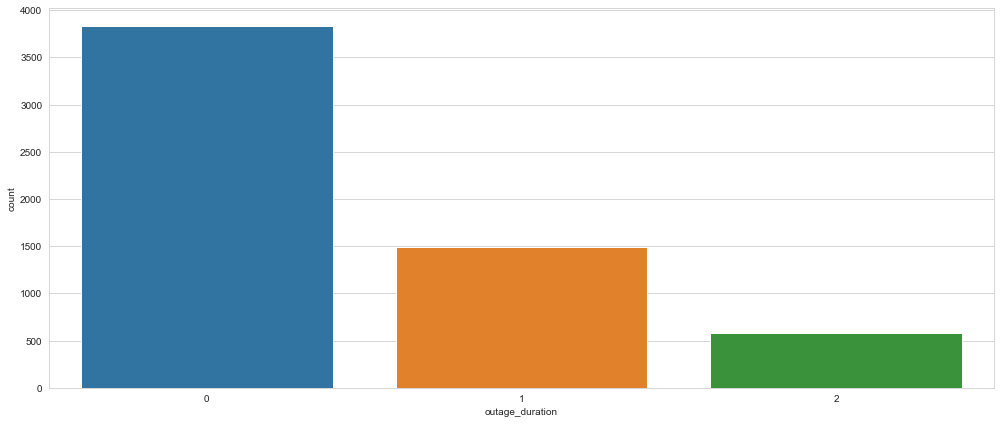

In [452]:
#count plot for Outage Duration 

plt.figure(figsize = (14,6))
sns.countplot(train_data['outage_duration'])
plt.tight_layout()
plt.show()

#### As there are three different Outage durations

- outage durations, `0` for no outage
- outage durations, `1` for short outages that last anywhere between a few minutes and a maximum of 2 hours
- outage durations, `2` for long outages that can last from 2 hours to sometimes even a couple of days.

                     ---------------------------------------------------------------------

### Plot with ID vs Area Code

In [453]:
import plotly.offline as pyo
import plotly.graph_objs as go
data = [go.Scatter(x=train_data['area_code'],
                 y=train_data['id'],
                 mode="markers",text=train_data["area_code"])]
layout=go.Layout(title="ID vs Area_code",xaxis={"title":"area_code"},yaxis=dict(title="ID"),hovermode="closest")
fig=go.Figure(data,layout)
fig.show()

#### From the plot most of the ID's are covered in particular area, As we can see in the graph, as the Number of users are reduces in some of the specific areas

                     ---------------------------------------------------------------------

### Plot with ID and Outage Durations.
- All the three Outage Durations

In [637]:
import plotly.offline as pyo
import plotly.graph_objs as go
data = [go.Scatter(x=train_data.loc[train_data.outage_duration==0,'area_code'],
                 y=train_data.loc[train_data.outage_duration==0,'id'],
                 mode="markers",text=train_data["outage_duration"]),
        go.Scatter(x=train_data.loc[train_data.outage_duration==1,'area_code'],
                 y=train_data.loc[train_data.outage_duration==1,'id'],
                 mode="markers",text=train_data["outage_duration"]),
       go.Scatter(x=train_data.loc[train_data.outage_duration==2,'area_code'],
                 y=train_data.loc[train_data.outage_duration==2,'id'],
                 mode="markers",text=train_data["outage_duration"])]
layout=go.Layout(title="ID vs Area Code",xaxis={"title":"area_code"},yaxis=dict(title="ID"),hovermode="closest")
fig=go.Figure(data,layout)
fig.show()

#### Checking the number of outage_duration
* As we can see that there are three levels of outages
- 0 for NO outages : trace 0 -> Blue circles 
- 1 for Few minutes to few hours : trace 1 -> Red circles
- 2 for Few Hours and more : trace 2 -> Green circles

#### By plotting the Data with respect to ID's and outage duration , we can see that the number of users and outage is evenlly distributed, It's like there is no specific user ID's are facing the outages, All number of users are facing the outages 

### Checking the Plot with respect to Outage Duration 0, In Area Vs ID

In [638]:
import plotly.offline as pyo
import plotly.graph_objs as go
data = [go.Scatter(x=train_data.loc[train_data.outage_duration==0,'area_code'],
                 y=train_data.loc[train_data.outage_duration==0,'id'],
                 mode="markers",text=train_data["outage_duration"])]
layout=go.Layout(title="ID vs Area Code with Outage Duration : 0",xaxis={"title":"area_code"},yaxis=dict(title="ID"),hovermode="closest")
fig=go.Figure(data,layout)
fig.show()

#### From the plot we see the most of the ID with Area are `Not` facing much problem

In [639]:
### Checking the Plot with respect to Outage Duration 1, In Area Vs ID

In [640]:
import plotly.offline as pyo
import plotly.graph_objs as go
data = [go.Scatter(x=train_data.loc[train_data.outage_duration==1,'area_code'],
                 y=train_data.loc[train_data.outage_duration==1,'id'],
                 mode="markers",text=train_data["outage_duration"])]
layout=go.Layout(title="ID vs Area Code Outage Duration : 1",xaxis={"title":"area_code"},yaxis=dict(title="ID"),hovermode="closest")
fig=go.Figure(data,layout)
fig.show()

### Checking the Plot with respect to Outage Duration 2, In Area Vs ID

In [641]:
import plotly.offline as pyo
import plotly.graph_objs as go
data = [go.Scatter(x=train_data.loc[train_data.outage_duration==2,'area_code'],
                 y=train_data.loc[train_data.outage_duration==2,'id'],
                 mode="markers",text=train_data["outage_duration"])]
layout=go.Layout(title="ID vs Area Code Outage Duration : 2",xaxis={"title":"area_code"},yaxis=dict(title="ID"),hovermode="closest")
fig=go.Figure(data,layout)
fig.show()

#### From the plot we can see that the few areas are having high outages compared to the other areas

#### Maximum Outage Duration With Respect to Area

In [458]:
train_data_outage = train_data.loc[train_data.outage_duration==2,'area_code'].value_counts()

In [459]:
train_data_outage

area_1100    28
area_600     27
area_1107    27
area_821     24
area_734     23
             ..
area_1119     1
area_937      1
area_853      1
area_1017     1
area_839      1
Name: area_code, Length: 135, dtype: int64

In [642]:
train_data['outage_duration'].value_counts()

0    3827
1    1496
2     581
Name: outage_duration, dtype: int64

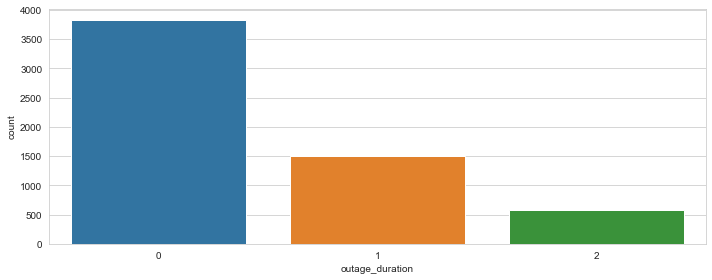

In [644]:
#count plot for Outage Duration 

plt.figure(figsize = (10,4))
sns.countplot(train_data['outage_duration'])
plt.tight_layout()
plt.show()

#### Outage for the users with percentage representations.

In [462]:
val=list(train_data['outage_duration'].value_counts())
for i in range(len(val)):
    print("Outage type",train_data['outage_duration'].value_counts().index[i],round(val[i]/sum(val)*100),'%')

Outage type 0 65 %
Outage type 1 25 %
Outage type 2 10 %


#### As we saw above the percentages of the Outage Durations, The visual representation of the same as we can see the number of counts of outages present in the data

#### Outage Duration 
##### Outage type 0 has 65% that is NO outage for those users,
##### Outage type 1 and 2 are facing outage breaks

In [645]:
# importing required libararies
import seaborn as sns
sns.set_style("whitegrid")

#### ------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

### Outage_Data

#### ● `outage_data.csv`: For each of the event `id`s mentioned in the `train_data.csv` and `test_data.csv` files and also some additional `id`s there is a record of the `outage_type` that is stored in the dataset. There are `5` different `outage_type`'s recorded in the dataset.

##### Reading the csv File

In [646]:
outage_data = pd.read_csv('/Users/nadeemm/Desktop/PHD B78/data/outage_data.csv')
outage_data.head()

,id,outage_type
0,6597,outage_type_2
1,8011,outage_type_2
2,2597,outage_type_2
3,5022,outage_type_1
4,6852,outage_type_1


In [649]:
outage_data.shape

(18552, 2)

###### There are two columns and 18852 rows of ID
- ID : 18552
- Outage type : There are 5 Different Outage_types
- shape : (18552,2)

### Plotting the number of counts of  Outage Type

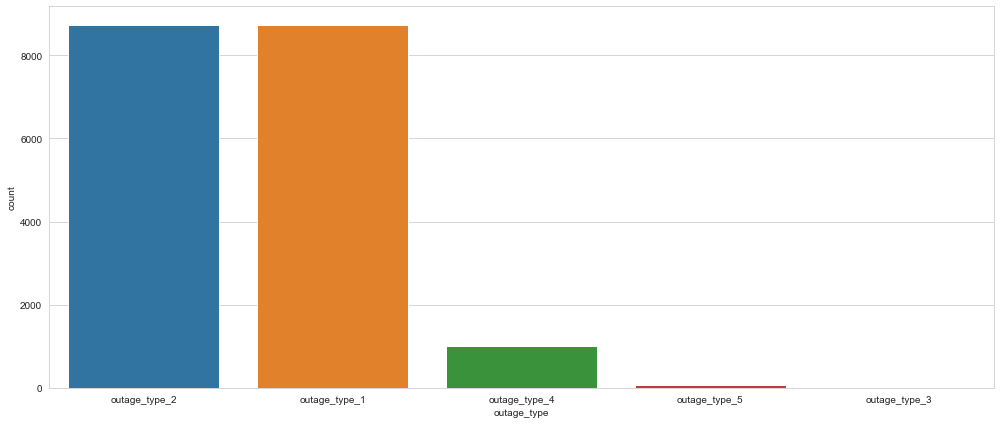

In [647]:
#count plot for Outage Duration

plt.figure(figsize = (14,6))
sns.countplot(outage_data['outage_type'])
plt.tight_layout()
plt.show()

#### There are 5 different types from outage type 1 to 5.
- Outage type 2 and Outage typw 1 is most repeated in the data 

In [466]:
outage_data['outage_type'].value_counts()

outage_type_2    8737
outage_type_1    8728
outage_type_4    1014
outage_type_5      65
outage_type_3       8
Name: outage_type, dtype: int64

Here we can see the value counts of each outage type

##### Let's look into the percentage of Outage type in the data

In [467]:
val=list(outage_data['outage_type'].value_counts())
for i in range(len(val)):
    print(outage_data['outage_type'].value_counts().index[i],round(val[i]/sum(val)*100),'%')

outage_type_2 47 %
outage_type_1 47 %
outage_type_4 5 %
outage_type_5 0 %
outage_type_3 0 %


### Removing the text

In [468]:
outage_data.outage_type=outage_data.outage_type.apply(lambda x: int(x.split("_")[2]))

In [469]:
outage_data.head()

,id,outage_type
0,6597,2
1,8011,2
2,2597,2
3,5022,1
4,6852,1


### Dummification of the Outage type

In [651]:
outage_type_dummies = pd.get_dummies(outage_data,columns=['outage_type'])


In [652]:
outage_type_dummies.head()

,id,outage_type_outage_type_1,outage_type_outage_type_2,outage_type_outage_type_3,outage_type_outage_type_4,outage_type_outage_type_5
0,6597,0,1,0,0,0
1,8011,0,1,0,0,0
2,2597,0,1,0,0,0
3,5022,1,0,0,0,0
4,6852,1,0,0,0,0


In [654]:
outage_data.describe(include='all')

,id,outage_type
count,18552.000000,18552
unique,NaN,5
top,NaN,outage_type_2
freq,NaN,8737
mean,9276.500000,NaN
std,5355.645433,NaN
min,1.000000,NaN
25%,4638.750000,NaN
50%,9276.500000,NaN
75%,13914.250000,NaN


###### From the above describtion.
- total count is 18552
- Outage type 2 is repeated the most
- There are 5 level's of Outage type
- Frequency is 8737, i.e., the Outage type has been repeated in the record

#### ------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

### Server_Data

### ● `server_data.csv`: For each of the event `id`s mentioned in the `train_data.csv` and `test_data.csv` files and also some additional `id`s there is a record of the `transit_server_type` that is stored in the dataset. Transit Servers handle the requests and responses of the customers.


##### Looking into the first 5 rows of the data

In [673]:
server_data = pd.read_csv('/Users/nadeemm/Desktop/PHD B78/data/server_data.csv')
server_data.head()

,id,transit_server_type
0,6597,transit_server_type_11
1,8011,transit_server_type_15
2,2597,transit_server_type_15
3,5022,transit_server_type_15
4,5022,transit_server_type_11


In [674]:
server_data.shape

(31170, 2)

In [675]:
server_data.nunique().value_counts()

53       1
18552    1
dtype: int64

#### From the Server Data.
- there are two columns in the dataframe
- ID : 31170 and unique is 18552
- Server type : Total there are 53 Server's in the given data set

#### Checking the Value count of the server type.

In [676]:
server_count = server_data['transit_server_type'].value_counts()
server_count

transit_server_type_11    7888
transit_server_type_35    6615
transit_server_type_34    5927
transit_server_type_15    4395
transit_server_type_20    1458
transit_server_type_54     684
transit_server_type_13     582
transit_server_type_42     478
transit_server_type_44     466
transit_server_type_23     429
transit_server_type_14     330
transit_server_type_43     306
transit_server_type_22     223
transit_server_type_50     154
transit_server_type_10     145
transit_server_type_21     136
transit_server_type_18      73
transit_server_type_47      69
transit_server_type_26      65
transit_server_type_32      63
transit_server_type_30      60
transit_server_type_45      53
transit_server_type_24      46
transit_server_type_27      44
transit_server_type_29      42
transit_server_type_40      40
transit_server_type_46      38
transit_server_type_2       37
transit_server_type_28      32
transit_server_type_8       29
transit_server_type_6       28
transit_server_type_5       26
transit_

#### Checking the Value count with percentage wise

In [677]:
val=list(server_data['transit_server_type'].value_counts())
for i in range(len(val)):
    print(server_data['transit_server_type'].value_counts().index[i],round(val[i]/sum(val)*100),'%')

transit_server_type_11 25 %
transit_server_type_35 21 %
transit_server_type_34 19 %
transit_server_type_15 14 %
transit_server_type_20 5 %
transit_server_type_54 2 %
transit_server_type_13 2 %
transit_server_type_42 2 %
transit_server_type_44 1 %
transit_server_type_23 1 %
transit_server_type_14 1 %
transit_server_type_43 1 %
transit_server_type_22 1 %
transit_server_type_50 0 %
transit_server_type_10 0 %
transit_server_type_21 0 %
transit_server_type_18 0 %
transit_server_type_47 0 %
transit_server_type_26 0 %
transit_server_type_32 0 %
transit_server_type_30 0 %
transit_server_type_45 0 %
transit_server_type_24 0 %
transit_server_type_27 0 %
transit_server_type_29 0 %
transit_server_type_40 0 %
transit_server_type_46 0 %
transit_server_type_2 0 %
transit_server_type_28 0 %
transit_server_type_8 0 %
transit_server_type_6 0 %
transit_server_type_5 0 %
transit_server_type_7 0 %
transit_server_type_38 0 %
transit_server_type_3 0 %
transit_server_type_36 0 %
transit_server_type_39 0 %
tra

### Plotting with ID vs Transit Server Type

In [678]:
# x and y given as array_like objects
import plotly.express as px
fig = px.scatter(server_data['id'], server_data['transit_server_type'])
fig.show()

##### ID in X-axis and Transit server in Y-axis.
- In the scartted plot Few ID's are using few servers
- Likely Many Users are opting to very servers.

### Plotting Server type Count

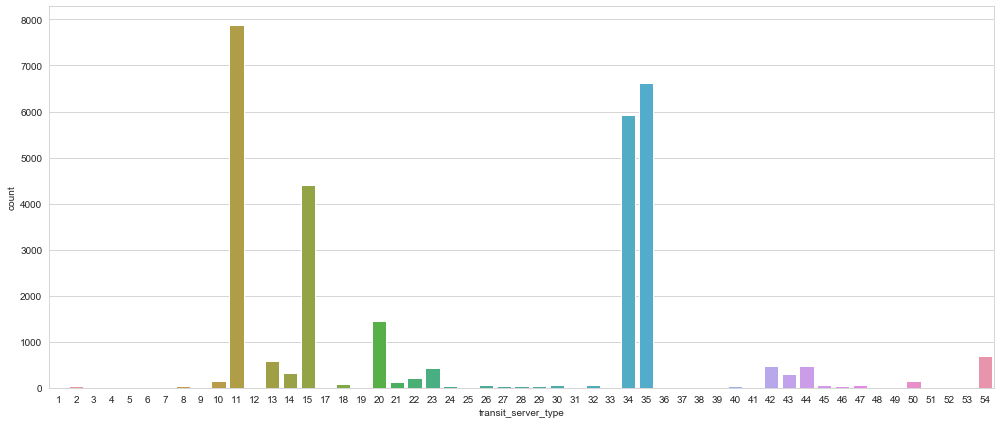

In [683]:
#count plot for transit server type

plt.figure(figsize = (14,6))
sns.countplot(server_data['transit_server_type'])
plt.tight_layout()
plt.show()

#### As from the above plot we can see.
- Server 11 has most users : 25% of users from the given data, i.e., 7888 times it has been repeated
- Server 35 has next number of users.

#### Top Five server Types used the most in the Given Data.

In [680]:
server_count.head()

transit_server_type_11    7888
transit_server_type_35    6615
transit_server_type_34    5927
transit_server_type_15    4395
transit_server_type_20    1458
Name: transit_server_type, dtype: int64

In [681]:
server_data.head()

,id,transit_server_type
0,6597,transit_server_type_11
1,8011,transit_server_type_15
2,2597,transit_server_type_15
3,5022,transit_server_type_15
4,5022,transit_server_type_11


#### Let's Remove the text from the transit server type.

In [682]:
server_data.transit_server_type=server_data.transit_server_type.apply(lambda x: int(x.split("_")[3]))

##### After removing the text from the column transit_server_type, the top 10 rows 

In [684]:
server_data.head(10)

,id,transit_server_type
0,6597,11
1,8011,15
2,2597,15
3,5022,15
4,5022,11
5,6852,11
6,6852,15
7,5611,15
8,14838,15
9,14838,11


#### Exploring the Value Counts of the Server Data

In [685]:
server_data['transit_server_type'].value_counts().sum()

31170

In [686]:
server_data.shape

(31170, 2)

#### Dummification of the server type as we know there are 53 server types.

In [687]:
server_type_dummies = pd.get_dummies(server_data,columns=['transit_server_type'])

In [688]:
server_type_dummies.head()

,id,transit_server_type_1,transit_server_type_2,transit_server_type_3,transit_server_type_4,transit_server_type_5,transit_server_type_6,transit_server_type_7,transit_server_type_8,transit_server_type_9,...,transit_server_type_45,transit_server_type_46,transit_server_type_47,transit_server_type_48,transit_server_type_49,transit_server_type_50,transit_server_type_51,transit_server_type_52,transit_server_type_53,transit_server_type_54
0,6597,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,8011,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,2597,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,5022,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,5022,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [488]:
server_type_dummies.shape

(31170, 54)

##### After Dummification we get 53 new columns and with ID we have 54 columns and 31170 ID

In [698]:
server_data.describe(include='all')

,id,transit_server_type
count,31170.000000,31170.000000
mean,9267.735258,24.740680
std,5363.817181,12.152183
min,1.000000,1.000000
25%,4625.250000,11.000000
50%,9287.500000,23.000000
75%,13915.000000,35.000000
max,18552.000000,54.000000


#### ------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

### Report Data

### ● `report_data.csv`: For each event `id` there are `log_report_type` and `volume` columns are recorded. `log_report_type` is a type of the recorded report generated by a technical team member after evaluating the outage. `volume` is the volume of data handled in the area at the time of report in custom company specific units.


#### Reading the Report Data 

In [702]:
report_data = pd.read_csv('/Users/nadeemm/Desktop/PHD B78/data/report_data.csv')

#### Taking a look at top five rows from the report data

In [703]:
report_data.head()

,id,log_report_type,volume
0,6597,log_report_type_68,6
1,8011,log_report_type_68,7
2,2597,log_report_type_68,1
3,5022,log_report_type_172,2
4,5022,log_report_type_56,1


In [704]:
report_data.shape

(58671, 3)

In [706]:
report_data.nunique()

id                 18552
log_report_type      386
volume               341
dtype: int64

#### Report Data: There are three columns
- ID : 58671
- Log_report_type: Has 386 log report customer service record issue
- Volume : There are 341 Volumes, for 10 minutes prior to the time of recording the observation as per custom company specific units.

#### Value Count for Log Report Type

In [708]:
log_report_ = report_data['log_report_type'].value_counts()

In [710]:
log_report_.head(10)

log_report_type_312    5267
log_report_type_232    4754
log_report_type_82     3472
log_report_type_203    2823
log_report_type_313    2145
log_report_type_233    1901
log_report_type_307    1597
log_report_type_54     1573
log_report_type_170    1526
log_report_type_71     1514
Name: log_report_type, dtype: int64

#### Looking into the top 10 report's issued by the custombers, Frequently more in the given Data

### Let's See the Percentage for the Log Report Type

In [495]:
val=list(report_data['log_report_type'].value_counts())
for i in range(len(val)):
    print(report_data['log_report_type'].value_counts().index[i],round(val[i]/sum(val)*100),'%')

log_report_type_312 9 %
log_report_type_232 8 %
log_report_type_82 6 %
log_report_type_203 5 %
log_report_type_313 4 %
log_report_type_233 3 %
log_report_type_307 3 %
log_report_type_54 3 %
log_report_type_170 3 %
log_report_type_71 3 %
log_report_type_315 3 %
log_report_type_134 2 %
log_report_type_80 2 %
log_report_type_235 2 %
log_report_type_193 2 %
log_report_type_219 2 %
log_report_type_68 2 %
log_report_type_227 2 %
log_report_type_314 2 %
log_report_type_201 2 %
log_report_type_234 2 %
log_report_type_73 1 %
log_report_type_195 1 %
log_report_type_301 1 %
log_report_type_309 1 %
log_report_type_55 1 %
log_report_type_229 1 %
log_report_type_273 1 %
log_report_type_308 1 %
log_report_type_368 1 %
log_report_type_376 1 %
log_report_type_171 1 %
log_report_type_228 1 %
log_report_type_283 1 %
log_report_type_306 1 %
log_report_type_291 1 %
log_report_type_310 1 %
log_report_type_230 1 %
log_report_type_70 1 %
log_report_type_345 1 %
log_report_type_81 1 %
log_report_type_191 1 %
l

log_report_type_329 0 %
log_report_type_12 0 %
log_report_type_350 0 %
log_report_type_245 0 %
log_report_type_326 0 %
log_report_type_271 0 %
log_report_type_210 0 %
log_report_type_9 0 %
log_report_type_100 0 %
log_report_type_258 0 %
log_report_type_269 0 %
log_report_type_250 0 %
log_report_type_128 0 %
log_report_type_260 0 %
log_report_type_343 0 %
log_report_type_106 0 %
log_report_type_281 0 %
log_report_type_386 0 %
log_report_type_297 0 %
log_report_type_13 0 %
log_report_type_257 0 %
log_report_type_119 0 %
log_report_type_296 0 %


### Plot for Log Report Type

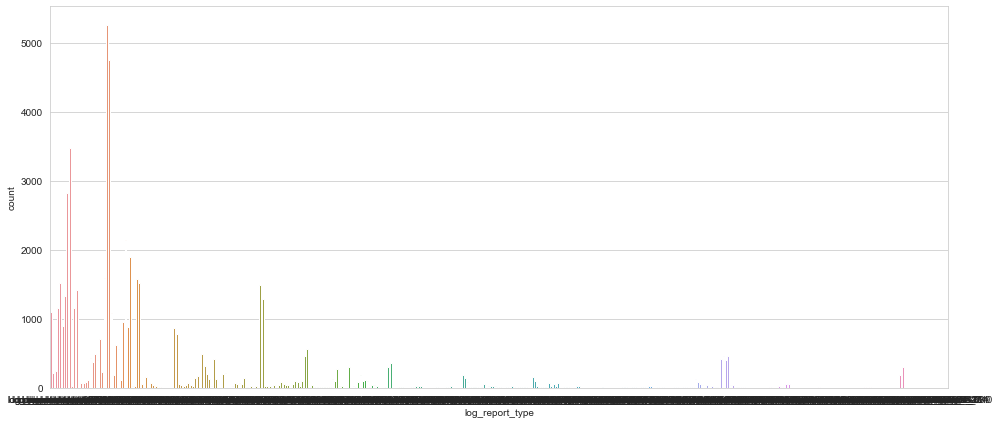

In [711]:
#count plot for Log Report Type

plt.figure(figsize = (14,6))
sns.countplot(report_data['log_report_type'])
plt.tight_layout()
plt.show()

#### From the above plot without removing the text from the feature it's not able to see clearly

### Removing the text from the Log Report Type column and keeping numerator alone

In [712]:
report_data.log_report_type=report_data.log_report_type.apply(lambda x: int(x.split("_")[3]))

In [713]:
report_data.head()

,id,log_report_type,volume
0,6597,68,6
1,8011,68,7
2,2597,68,1
3,5022,172,2
4,5022,56,1


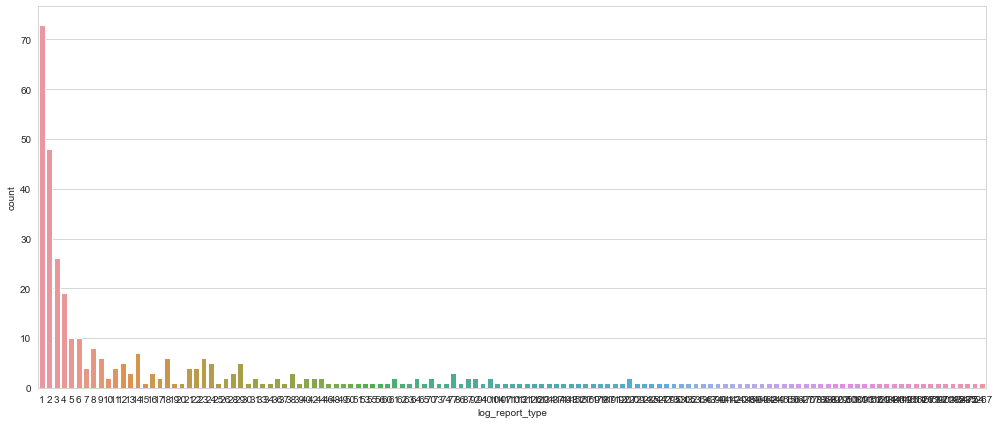

In [731]:
#count plot for Log Report Type

plt.figure(figsize = (14,6))
sns.countplot(report_data['log_report_type'].value_counts())
plt.tight_layout()
plt.show()

#### The Above plot represents the number of reports in assending order of value counts in top order of log report by customber complents

#### Top records of log report type receved by the customer service representatives

In [727]:
log_report_.head(10)

log_report_type_312    5267
log_report_type_232    4754
log_report_type_82     3472
log_report_type_203    2823
log_report_type_313    2145
log_report_type_233    1901
log_report_type_307    1597
log_report_type_54     1573
log_report_type_170    1526
log_report_type_71     1514
Name: log_report_type, dtype: int64

### Reset of index and given it a new name 

In [732]:
report_data.reset_index(inplace=True)
report_data.rename(columns={'index':'count_of_log_report_seen'},inplace=True)

##### The New Feature 'Count of Log report seen' is to map back to the orginal ID after creating new features and to check the feature created is properlly matched!!! 

In [733]:
report_data.head()

,count_of_log_report_seen,id,log_report_type,volume
0,0,6597,68,6
1,1,8011,68,7
2,2,2597,68,1
3,3,5022,172,2
4,4,5022,56,1


### Creating New Feature with number of ID of log features

In [734]:
report_data_value_counts = report_data.log_report_type.value_counts().to_dict()
report_data['num_ids_with_log_feature'] = report_data['log_report_type'].map(lambda x: report_data_value_counts[x])

##### Creating new feature by mapping the log report type by using dictionary and put in the new feature

In [735]:
report_data.head()

,count_of_log_report_seen,id,log_report_type,volume,num_ids_with_log_feature
0,0,6597,68,6,1093
1,1,8011,68,7,1093
2,2,2597,68,1,1093
3,3,5022,172,2,214
4,4,5022,56,1,244


#### Manually binning the report data to map the ID 

In [736]:
bins = [-10,0,10,20,30,40,50,60,70,80,90,100,110,120,130,140,150,160,170,180,190,
        200,210,220,230,240,250,260,270,280,290,300,310,320,330,340,350,360,
        370,380,390,400]
report_data['binned_log_report'] = np.digitize(report_data['log_report_type'], bins, right=True)
bins_offset = list(map(lambda x:x+5, bins))
report_data['binned_offset_log_report'] = np.digitize(report_data['log_report_type'], bins_offset, right=True)

##### As we have many levels in the log report type, we have done manual binning to reduce the complexity.

- Created new feature 'Binned log report'
- np.digitize : Return the indices of the bins to which each value in input array belongs.

- Another Feature for Binned offset log report 
- Bins offset Not be more then 5, to keep in threshold. 

In [738]:
report_data.head()

,count_of_log_report_seen,id,log_report_type,volume,num_ids_with_log_feature,binned_log_report,binned_offset_log_report
0,0,6597,68,6,1093,8,8
1,1,8011,68,7,1093,8,8
2,2,2597,68,1,1093,8,8
3,3,5022,172,2,214,19,18
4,4,5022,56,1,244,7,7


#### Above we could see there is a lag of shift in the features binned so we have to position the log feature,
- We'll Create a column position log features and groupby the cummulitive sum

### Creating Feature for lag position

In [739]:
report_data['position_of_log_report'] = 1
report_data['position_of_log_report'] = report_data.groupby(['id'])['position_of_log_report'].cumsum()
report_data['log_report_type'] = report_data['log_report_type'].astype(int)

- Initially assigning position of log report to 1
- Grouping the ID with respect to Position of log report with cummulative sum(Partially summing of sequence)

In [747]:
import plotly.offline as pyo
import plotly.graph_objs as go
data = [go.Scatter(x=report_data.loc[report_data.log_report_type,'log_report_type'],
                 y=train_data.loc[report_data.log_report_type,'id'],
                 mode="markers",text=report_data["log_report_type"])]
layout=go.Layout(title="ID vs Log Report Type",xaxis={"title":"Log Report Type"},yaxis=dict(title="ID"),hovermode="closest")
fig=go.Figure(data,layout)
fig.show()

#### From the plot as we have explored, The log report is varied with the ID user and log report

In [748]:
report_data.head()

,count_of_log_report_seen,id,log_report_type,volume,num_ids_with_log_feature,binned_log_report,binned_offset_log_report,position_of_log_report
0,0,6597,68,6,1093,8,8,1
1,1,8011,68,7,1093,8,8,1
2,2,2597,68,1,1093,8,8,1
3,3,5022,172,2,214,19,18,1
4,4,5022,56,1,244,7,7,2


In [749]:
report_data.describe(include='all')

,count_of_log_report_seen,id,log_report_type,volume,num_ids_with_log_feature,binned_log_report,binned_offset_log_report,position_of_log_report
count,58671.000000,58671.000000,58671.000000,58671.000000,58671.000000,58671.000000,58671.000000,58671.000000
mean,29335.000000,9271.368905,209.092465,9.685296,1873.706175,22.472465,21.756234,2.816809
std,16937.003159,5355.142878,93.066417,27.314433,1680.450516,9.317041,9.318942,2.196520
min,0.000000,1.000000,1.000000,1.000000,1.000000,2.000000,1.000000,1.000000
25%,14667.500000,4658.500000,134.000000,1.000000,484.000000,15.000000,14.000000,1.000000
50%,29335.000000,9275.000000,227.000000,2.000000,1419.000000,24.000000,24.000000,2.000000
75%,44002.500000,13903.000000,307.000000,7.000000,2823.000000,32.000000,32.000000,4.000000
max,58670.000000,18552.000000,386.000000,1310.000000,5267.000000,40.000000,40.000000,20.000000


#### ------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

### Broadband Data

### ● `broadband_data.csv`: For each of the event `id`s mentioned in the `train_data.csv` and `test_data.csv` files and also some additional `id`s there is a record of the `broadband_type` that is stored in the dataset. There are `10 different types` of broadbands that are observed in the dataset

#### Reading the Broadband Data

In [750]:
broadband_data = pd.read_csv('/Users/nadeemm/Desktop/PHD B78/data/broadband_data.csv')

In [751]:
broadband_data.head()

,id,broadband_type
0,6597,broadband_type_8
1,8011,broadband_type_8
2,2597,broadband_type_8
3,5022,broadband_type_8
4,6852,broadband_type_8


In [754]:
broadband_data.shape

(21076, 2)

In [755]:
broadband_data.nunique()

id                18552
broadband_type       10
dtype: int64

#### BroadBand Data:
- ID : 21076, Unique ID : 18552
- Broadband type : 10 Broadband types avaliable 

### Value Count for Broadband Data 

In [752]:
broadband_data['broadband_type'].value_counts()

broadband_type_8     10268
broadband_type_2      8918
broadband_type_6       582
broadband_type_7       498
broadband_type_4       330
broadband_type_9       190
broadband_type_3       145
broadband_type_10       73
broadband_type_1        58
broadband_type_5        14
Name: broadband_type, dtype: int64

#### Broadband types description
- broadband_type_8 : 'ADSL 1'
- broadband_type_2 : 'ADSL 2'
- broadband_type_6 : 'ADSL 2+' 
- broadband_type_7 : 'Cable'
- broadband_type_4 : 'Fiber 1'
- broadband_type_9 : 'BPL'
- broadband_type_3 : 'Fiber 2'
- broadband_type_10 : 'Fiber High Speed'
- broadband_type_1 : 'Fiber Ultra'
- broadband_type_5 : 'Fiber Ultra Max'
    
** From the data Broadband type 8 : 'ADSL 1' is used more in the given data, then broadband type 2 and so onn.

### Percentage of Broadband types through Value counts in the Data

In [757]:
val=list(broadband_data['broadband_type'].value_counts())
for i in range(len(val)):
    print(broadband_data['broadband_type'].value_counts().index[i],round(val[i]/sum(val)*100),'%')

broadband_type_8 49 %
broadband_type_2 42 %
broadband_type_6 3 %
broadband_type_7 2 %
broadband_type_4 2 %
broadband_type_9 1 %
broadband_type_3 1 %
broadband_type_10 0 %
broadband_type_1 0 %
broadband_type_5 0 %


### Plot for Broadband types

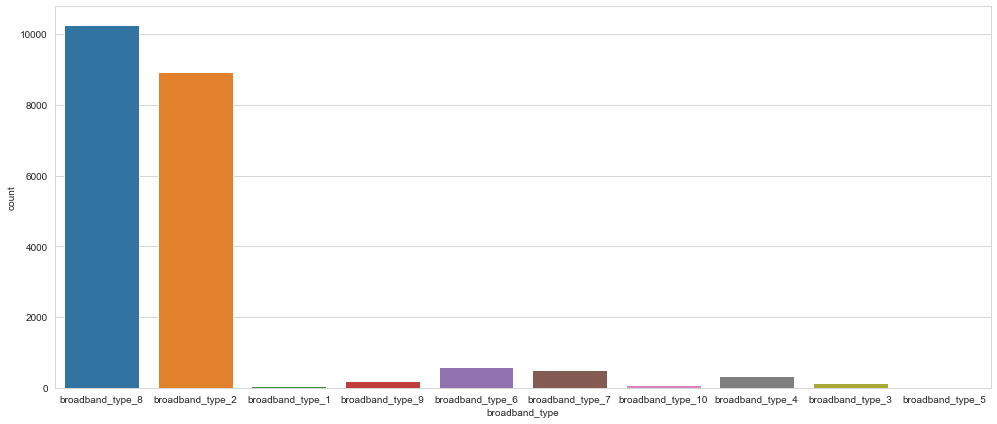

In [758]:
#count plot for broadband type

plt.figure(figsize = (14,6))
sns.countplot(broadband_data['broadband_type'])
plt.tight_layout()
plt.show()

#### From the plot we can see the usage of Broadband by the used as per the data given.

### Removing the Text from the Broadband type and keeping numbers.

In [760]:
broadband_data.broadband_type=broadband_data.broadband_type.apply(lambda x: int(x.split("_")[2]))

In [761]:
broadband_data

,id,broadband_type
0,6597,8
1,8011,8
2,2597,8
3,5022,8
4,6852,8
...,...,...
21071,3761,8
21072,8720,8
21073,6488,8
21074,878,8


In [765]:
import plotly.offline as pyo
import plotly.graph_objs as go
data = [go.Scatter(x=broadband_data.id,
                 y=broadband_data.broadband_type,
                 mode="markers",text=broadband_data["broadband_type"])]
layout=go.Layout(title="ID vs Broadband Type",xaxis={"title":"ID"},yaxis=dict(title="Broadband Type"),hovermode="closest")
fig=go.Figure(data,layout)
fig.show()

In [766]:
broadband_data.head()

,id,broadband_type
0,6597,8
1,8011,8
2,2597,8
3,5022,8
4,6852,8


### Dummification of Broadband type

In [767]:
broadband_type_dummies = pd.get_dummies(broadband_data,columns=['broadband_type'])

In [768]:
broadband_type_dummies

,id,broadband_type_1,broadband_type_2,broadband_type_3,broadband_type_4,broadband_type_5,broadband_type_6,broadband_type_7,broadband_type_8,broadband_type_9,broadband_type_10
0,6597,0,0,0,0,0,0,0,1,0,0
1,8011,0,0,0,0,0,0,0,1,0,0
2,2597,0,0,0,0,0,0,0,1,0,0
3,5022,0,0,0,0,0,0,0,1,0,0
4,6852,0,0,0,0,0,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...
21071,3761,0,0,0,0,0,0,0,1,0,0
21072,8720,0,0,0,0,0,0,0,1,0,0
21073,6488,0,0,0,0,0,0,0,1,0,0
21074,878,0,0,0,0,0,0,0,1,0,0


#### After Dummifing the broadband type we get (21076x11) columns

In [769]:
val=list(broadband_data['broadband_type'].value_counts())
for i in range(len(val)):
    print(broadband_data['broadband_type'].value_counts().index[i],round(val[i]/sum(val)*100),'%')

8 49 %
2 42 %
6 3 %
7 2 %
4 2 %
9 1 %
3 1 %
10 0 %
1 0 %
5 0 %


#### As we can see that Broadband type 8 : ADSL1 is used more in the data
- After Binning the data, Found that broadband 8 must be put in different columns by shifting 1 or lag 01

### Creating new feature Broadband Shifted up
- As we can see that after dummification broadband type 8 is repeated 49% of time and broadband type 2 is has 42%
- To make Data more representative we're shifting it to one

In [770]:
broadband_data['broadband_shifted_up'] = broadband_data['broadband_type'].shift(1)

In [771]:
broadband_data['broadband_shifted_up'] = broadband_data['broadband_shifted_up'].astype('float64','ignore')

In [772]:
broadband_data.head()

,id,broadband_type,broadband_shifted_up
0,6597,8,NaN
1,8011,8,8.0
2,2597,8,8.0
3,5022,8,8.0
4,6852,8,8.0


#### After the shift we're getting NaN
- we need to fill the NaN 

In [774]:
broadband_data.dtypes

id                        int64
broadband_type            int64
broadband_shifted_up    float64
dtype: object

In [775]:
broadband_data['broadband_type']=broadband_data['broadband_type'].astype('int64')


In [776]:
broadband_data.isnull().sum()

id                      0
broadband_type          0
broadband_shifted_up    1
dtype: int64

#### We can see that above feature has NaN so we should fill the data with broadband type 8 as it's repeated more.

In [777]:
broadband_data['broadband_shifted_up'].fillna(8,inplace=True)

In [778]:
broadband_data.head()

,id,broadband_type,broadband_shifted_up
0,6597,8,8.0
1,8011,8,8.0
2,2597,8,8.0
3,5022,8,8.0
4,6852,8,8.0


In [779]:
broadband_data.describe()

,id,broadband_type,broadband_shifted_up
count,21076.000000,21076.000000,21076.000000
mean,9255.869330,5.279987,5.279987
std,5366.730222,2.924911,2.924911
min,1.000000,1.000000,1.000000
25%,4599.750000,2.000000,2.000000
50%,9256.500000,7.000000,7.000000
75%,13907.250000,8.000000,8.000000
max,18552.000000,10.000000,10.000000


#### Let's check the next Broadband type repeated or it's Different from the previous one!
- Create two new features or the repeated and different type!!

In [780]:
broadband_data['is_next_broadband_type_repeat'] = 0
broadband_data['is_next_broadband_type_different'] = 0

In [781]:
broadband_data.head()

,id,broadband_type,broadband_shifted_up,is_next_broadband_type_repeat,is_next_broadband_type_different
0,6597,8,8.0,0,0
1,8011,8,8.0,0,0
2,2597,8,8.0,0,0
3,5022,8,8.0,0,0
4,6852,8,8.0,0,0


####  Initially we have assigned it to '0'
##### Cheaking with the original broadband type is correctly matched with shifted broadband type

In [782]:
repeat_cond = broadband_data['broadband_shifted_up'] == broadband_data['broadband_type']

In [783]:
repeat_cond.value_counts

<bound method IndexOpsMixin.value_counts of 0        True
1        True
2        True
3        True
4        True
         ... 
21071    True
21072    True
21073    True
21074    True
21075    True
Length: 21076, dtype: bool>

### Creating New Feature is next broadband type repeated

In [784]:
broadband_data['is_next_broadband_type_repeat'][repeat_cond] = 1

In [785]:
broadband_data.head()

,id,broadband_type,broadband_shifted_up,is_next_broadband_type_repeat,is_next_broadband_type_different
0,6597,8,8.0,1,0
1,8011,8,8.0,1,0
2,2597,8,8.0,1,0
3,5022,8,8.0,1,0
4,6852,8,8.0,1,0


In [786]:
broadband_data['is_next_broadband_type_repeat'][~repeat_cond] = 1 # ~ Binary Ones Complement

In [787]:
broadband_data.head()

,id,broadband_type,broadband_shifted_up,is_next_broadband_type_repeat,is_next_broadband_type_different
0,6597,8,8.0,1,0
1,8011,8,8.0,1,0
2,2597,8,8.0,1,0
3,5022,8,8.0,1,0
4,6852,8,8.0,1,0


### Creating new feature switches broadband type 

* Return the cumulative sum of the elements along a given axis. (cumsum())

In [788]:
broadband_data['switches_broadband_type'] = broadband_data['is_next_broadband_type_different'].cumsum()

In [789]:
broadband_data['switches_broadband_type'].value_counts()

0    21076
Name: switches_broadband_type, dtype: int64

In [790]:
broadband_data

,id,broadband_type,broadband_shifted_up,is_next_broadband_type_repeat,is_next_broadband_type_different,switches_broadband_type
0,6597,8,8.0,1,0,0
1,8011,8,8.0,1,0,0
2,2597,8,8.0,1,0,0
3,5022,8,8.0,1,0,0
4,6852,8,8.0,1,0,0
...,...,...,...,...,...,...
21071,3761,8,8.0,1,0,0
21072,8720,8,8.0,1,0,0
21073,6488,8,8.0,1,0,0
21074,878,8,8.0,1,0,0


In [796]:
broadband_data.nunique().value_counts

<bound method IndexOpsMixin.value_counts of id                                  18552
broadband_type                         10
broadband_shifted_up                   10
is_next_broadband_type_repeat           1
is_next_broadband_type_different        1
switches_broadband_type                 1
dtype: int64>

#### There are no repeatation in the dummified data, we can drop the features.

In [797]:
broadband_data.describe()

,id,broadband_type,broadband_shifted_up,is_next_broadband_type_repeat,is_next_broadband_type_different,switches_broadband_type
count,21076.000000,21076.000000,21076.000000,21076.0,21076.0,21076.0
mean,9255.869330,5.279987,5.279987,1.0,0.0,0.0
std,5366.730222,2.924911,2.924911,0.0,0.0,0.0
min,1.000000,1.000000,1.000000,1.0,0.0,0.0
25%,4599.750000,2.000000,2.000000,1.0,0.0,0.0
50%,9256.500000,7.000000,7.000000,1.0,0.0,0.0
75%,13907.250000,8.000000,8.000000,1.0,0.0,0.0
max,18552.000000,10.000000,10.000000,1.0,0.0,0.0


In [798]:
broadband_data.dtypes

id                                    int64
broadband_type                        int64
broadband_shifted_up                float64
is_next_broadband_type_repeat         int64
is_next_broadband_type_different      int64
switches_broadband_type               int64
dtype: object

#### ------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

### Merging the files 

### Checking the Unique ID's From all the Data set's

In [799]:
print("Number of unique ID's in Train Data      : ",train_data.id.nunique())
print("Number of unique ID's in Broadband Data  : ",broadband_data.id.nunique())
print("Number of unique ID's in Server Data     : ",server_data.id.nunique())
print("Number of unique ID's in Outage Data     : ",outage_data.id.nunique())
print("Number of unique ID's in Report Data     : ",report_data.id.nunique()) 

Number of unique ID's in Train Data      :  5904
Number of unique ID's in Broadband Data  :  18552
Number of unique ID's in Server Data     :  18552
Number of unique ID's in Outage Data     :  18552
Number of unique ID's in Report Data     :  18552


### Printing the Shape of all the Data Set's

In [800]:
print('The shape of train is: {}\n'.format(train_data.shape))
print('The shape of broadband is: {}\n'.format(broadband_data.shape))
print('The shape of server is: {}\n'.format(server_data.shape))
print('The shape of outage is: {}\n'.format(outage_data.shape))
print('The shape of report is: {}\n'.format(report_data.shape))



The shape of train is: (5904, 3)

The shape of broadband is: (21076, 6)

The shape of server is: (31170, 2)

The shape of outage is: (18552, 2)

The shape of report is: (58671, 8)



### Merging the Train Data with Broadband Data

In [801]:
train_broadband_combined = pd.merge(train_data,broadband_data,left_on = ['id'],
                               right_on = ['id'],how='left')

In [802]:
train_broadband_combined.shape

(6754, 8)

In [803]:
train_broadband_combined.head()

,id,area_code,outage_duration,broadband_type,broadband_shifted_up,is_next_broadband_type_repeat,is_next_broadband_type_different,switches_broadband_type
0,13366,area_415,1,2,2.0,1,0,0
1,6783,area_474,0,2,2.0,1,0,0
2,9519,area_931,1,8,8.0,1,0,0
3,10202,area_700,1,8,8.0,1,0,0
4,4555,area_600,2,8,8.0,1,0,0


### Answering the Questions
● Which areas are most prone to long outage durations?

● Which broadband types are suspect of long outage durations?

● Any other recommendations to improve the detection of outage durations.

### To answer the question!!

- We have merged the train data with broadband data

In [807]:
train_broadband_outage = train_broadband_combined.loc[train_broadband_combined.outage_duration==2,'broadband_type'].value_counts()

In [808]:
train_broadband_outage

8     544
2      82
6      26
4      17
1      10
7       9
9       4
3       4
5       3
10      1
Name: broadband_type, dtype: int64

#### By locating the Outage Duration == 2 the most prone outage duration, filtering with broadband type we got!!!
#### Broadband type 8 has most number of outages 

### Plot for Broadband types 

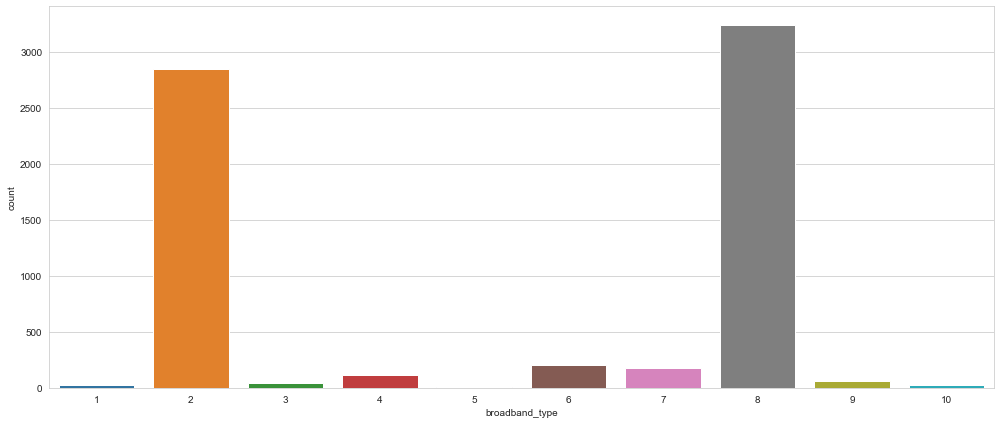

In [810]:
#count plot for broadband type

plt.figure(figsize = (14,6))
sns.countplot(train_broadband_combined['broadband_type'])
plt.tight_layout()
plt.show()

### To Answer Question
- 1.Which areas are most prone to long outage durations?

In [582]:
long_outage = train_data['outage_duration']==2
long_outage.head()

0    False
1    False
2    False
3    False
4     True
Name: outage_duration, dtype: bool

In [583]:
long_outage_ = train_data[long_outage]

In [584]:
long_outage_.head()

,id,area_code,outage_duration
4,4555,600,2
16,1373,962,2
24,4209,1086,2
32,8984,976,2
34,14361,704,2


1100    28
1107    27
600     27
821     24
734     23
704     19
1019    18
810     18
684     17
798     17
Name: area_code, dtype: int64

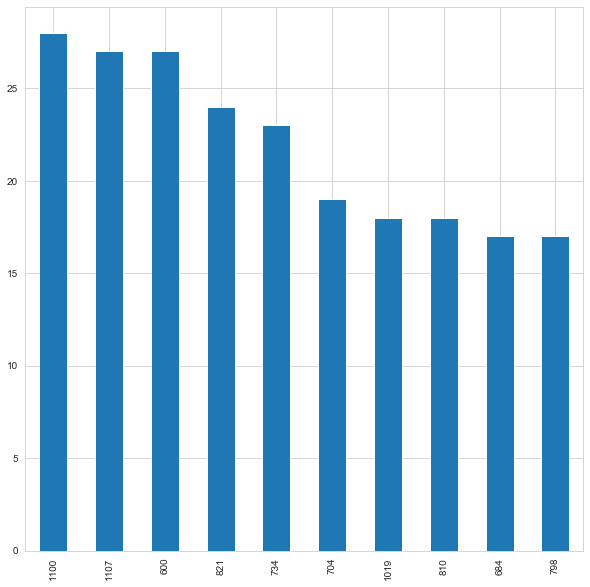

In [585]:
count=long_outage_.area_code.value_counts()
count.head(10).plot(kind="bar",figsize=(10,10))
count.head(10)

#### From the above graph we clearly see that Area_1100 has more Outages and is more Prone to outages!!!

#### ------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

### Train Data with Outage Data : Merge 

In [811]:
def str_to_num(string):
    return int(string.split("_")[1])

In [812]:
train_data["area_code"]=train_data["area_code"].apply(str_to_num)

In [813]:
merge_1 = train_data.merge(outage_data,how="left",left_on=["id"],right_on=["id"])

In [814]:
merge_1.head()

,id,area_code,outage_duration,outage_type
0,13366,415,1,outage_type_4
1,6783,474,0,outage_type_2
2,9519,931,1,outage_type_2
3,10202,700,1,outage_type_1
4,4555,600,2,outage_type_2


In [815]:
merge_1.set_index("id",inplace=True)

In [816]:
merge_1.describe()

,area_code,outage_duration
count,5904.000000,5904.000000
mean,623.909045,0.450203
std,320.360280,0.666642
min,1.000000,0.000000
25%,375.000000,0.000000
50%,661.000000,0.000000
75%,892.000000,1.000000
max,1126.000000,2.000000


In [817]:
merge_1["num"]=merge_1.groupby(['area_code',"outage_duration"]).cumcount()+1

In [818]:
merge_1[(merge_1["area_code"]==1) & (merge_1["outage_duration"]==1)]## num represents no of outages of each type in an area 
## to understand in which area which kind of outage is more so that our customer can focus on reducing it

,area_code,outage_duration,outage_type,num
id,,,,
9664,1,1,outage_type_2,1
3952,1,1,outage_type_1,2
15952,1,1,outage_type_1,3
1235,1,1,outage_type_1,4
14595,1,1,outage_type_2,5
5280,1,1,outage_type_1,6
17041,1,1,outage_type_1,7


In [819]:
merge_1.num.value_counts()

1     1386
2      862
3      586
4      434
5      342
6      285
7      241
8      209
9      183
10     166
11     146
12     127
13     110
14      95
15      91
16      82
17      70
18      58
19      51
20      44
21      40
22      38
23      33
24      28
25      22
26      20
27      19
28      14
29      12
31       9
30       9
34       8
33       8
32       8
35       7
37       6
36       6
39       5
38       5
41       5
42       5
40       5
43       4
45       3
44       3
47       2
46       2
55       1
48       1
52       1
56       1
49       1
53       1
51       1
50       1
54       1
57       1
Name: num, dtype: int64

In [820]:
data=[go.Histogram(x=merge_1["num"])]
layout=go.Layout(title="Histogram")
layout=go.Layout(title="number of cases",xaxis={"title":"number of cases"},yaxis=dict(title="count of no of cases"),hovermode="closest")
fig=go.Figure(data,layout)
fig.show()
## we can understand how many cases are common in an area like in general we can find minimum of 3 cases there in 586 areas.

In [821]:
import plotly.offline as pyo
import plotly.graph_objs as go
data = [go.Scatter(x=merge_1.loc[merge_1.outage_duration==0,'area_code'],
                 y=merge_1.loc[merge_1.outage_duration==0,'num'],
                 mode="markers",text=merge_1["outage_duration"]),
        go.Scatter(x=merge_1.loc[merge_1.outage_duration==1,'area_code'],
                 y=merge_1.loc[merge_1.outage_duration==1,'num'],
                 mode="markers",text=merge_1["outage_duration"]),
       go.Scatter(x=merge_1.loc[merge_1.outage_duration==2,'area_code'],
                 y=merge_1.loc[merge_1.outage_duration==2,'num'],
                 mode="markers",text=merge_1["outage_duration"])]
layout=go.Layout(title="num vs area_code",xaxis={"title":"area_code"},yaxis=dict(title="num"),hovermode="closest")
fig=go.Figure(data,layout)
fig.show()
## to understand in which area which kind of outage is more so that our customer can focus on reducing it
##i.e, to get more customer churn in an area we should concentrate on which kind of outage type.

#### ------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

### Server Data Merged With Train Data : Merge 

In [564]:
server_data

,id,transit_server_type
0,6597,11
1,8011,15
2,2597,15
3,5022,15
4,5022,11
...,...,...
31165,3761,11
31166,8720,11
31167,6488,11
31168,878,11


In [565]:
merge_2=server_data.merge(train_data, on='id')

In [566]:
merge_2.head()

,id,transit_server_type,area_code,outage_duration
0,8011,15,1,0
1,2588,15,1,0
2,2588,11,1,0
3,4848,11,1,0
4,4848,15,1,0


In [567]:
merge_2.isnull().sum()

id                     0
transit_server_type    0
area_code              0
outage_duration        0
dtype: int64

In [568]:
merge_2.nunique()

id                     5904
transit_server_type      49
area_code               876
outage_duration           3
dtype: int64

In [569]:
merge_2.shape

(9968, 4)

In [570]:
transit_server_type_unq=pd.DataFrame(merge_2.transit_server_type.value_counts())
transit_server_type_unq.head()

,transit_server_type
11,2473
35,2158
34,1925
15,1370
20,437


In [572]:
transit_server_type_unq["percen_trn"]=merge_2.transit_server_type.value_counts(normalize=True)*100

In [573]:
transit_server_type_unq

,transit_server_type,perctrn,percen_trn
11,2473,24.809390,24.809390
35,2158,21.649278,21.649278
34,1925,19.311798,19.311798
15,1370,13.743981,13.743981
20,437,4.384029,4.384029
54,203,2.036517,2.036517
13,201,2.016453,2.016453
23,159,1.595104,1.595104
42,148,1.484751,1.484751
44,142,1.424559,1.424559


In [574]:
merge_2.head()

,id,transit_server_type,area_code,outage_duration
0,8011,15,1,0
1,2588,15,1,0
2,2588,11,1,0
3,4848,11,1,0
4,4848,15,1,0


In [575]:
merge_2["num"]=merge_2.groupby(['transit_server_type','area_code']).cumcount()+1


In [576]:
merge_2.head()

,id,transit_server_type,area_code,outage_duration,num
0,8011,15,1,0,1
1,2588,15,1,0,2
2,2588,11,1,0,1
3,4848,11,1,0,2
4,4848,15,1,0,3


In [577]:
import plotly.offline as pyo
import plotly.graph_objs as go
data = [go.Scatter(x=merge_2.loc[:,'area_code'],
                 y=merge_2.loc[:,'num'],
                 mode="markers")]
layout=go.Layout(title="number of servers vs area_code",xaxis={"title":"area_code"},yaxis=dict(title="number of servers"),hovermode="closest")
fig=go.Figure(data,layout)
fig.show()## to understand how servers are divided w.r.t to area-wise


In [822]:
#### ------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

### Train Data with Broadband Data :  Merge 

In [602]:
train_data_ = pd.read_csv('/Users/nadeemm/Desktop/PHD B78/data/train_data.csv')
broadband_data_ = pd.read_csv('/Users/nadeemm/Desktop/PHD B78/data/broadband_data.csv')

In [603]:
train_broadband_combined_ = pd.merge(train_data,broadband_data,left_on = ['id'],
                               right_on = ['id'],how='left')

In [604]:
long_outage_2 = train_broadband_combined_['outage_duration']==2
long_outage_2.head()

0    False
1    False
2    False
3    False
4     True
Name: outage_duration, dtype: bool

In [605]:
long_outage_2_=train_broadband_combined_[long_outage_2]

In [606]:
long_outage_2_.head()

,id,area_code,outage_duration,broadband_type
4,4555,area_600,2,broadband_type_8
16,1373,area_962,2,broadband_type_8
24,4209,area_1086,2,broadband_type_8
33,8984,area_976,2,broadband_type_8
35,14361,area_704,2,broadband_type_8


broadband_type_8     544
broadband_type_2      82
broadband_type_6      26
broadband_type_4      17
broadband_type_1      10
broadband_type_7       9
broadband_type_9       4
broadband_type_3       4
broadband_type_5       3
broadband_type_10      1
Name: broadband_type, dtype: int64

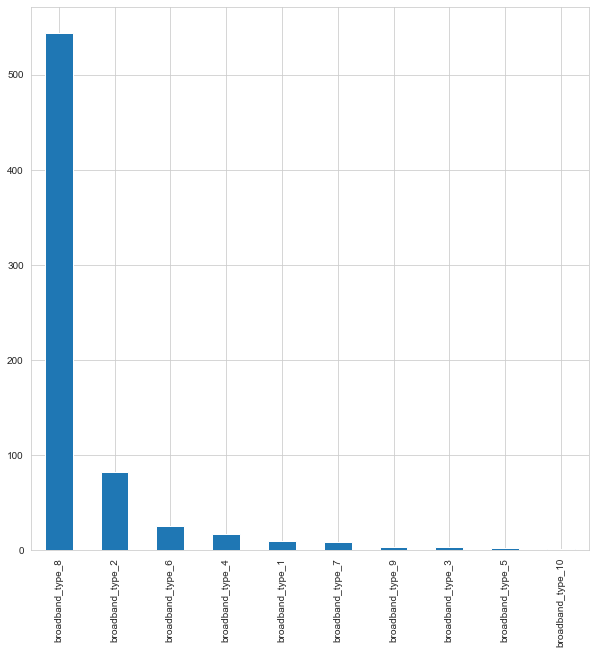

In [607]:
broad_band=long_outage_2_.broadband_type.value_counts()
broad_band.head(10).plot(kind="bar",figsize=(10,10))
broad_band.head(10)

#### ------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

### Train Data with Server Data : Merge

In [823]:
train_data_ = pd.read_csv('/Users/nadeemm/Desktop/PHD B78/data/train_data.csv')
server_data_ = pd.read_csv('/Users/nadeemm/Desktop/PHD B78/data/server_data.csv')

In [824]:
train_server_combined_1 = pd.merge(train_data_,server_data_,left_on = ['id'],
                               right_on = ['id'],how='left')

In [622]:
train_server_combined_1

,id,area_code,outage_duration,transit_server_type
0,13366,area_415,1,transit_server_type_35
1,6783,area_474,0,transit_server_type_35
2,6783,area_474,0,transit_server_type_34
3,9519,area_931,1,transit_server_type_15
4,10202,area_700,1,transit_server_type_11
...,...,...,...,...
9963,10475,area_821,0,transit_server_type_11
9964,10675,area_798,2,transit_server_type_15
9965,14714,area_210,0,transit_server_type_35
9966,14714,area_210,0,transit_server_type_34


In [623]:
long_outage_3 = train_server_combined_1['outage_duration']==2
long_outage_3.head()

0    False
1    False
2    False
3    False
4    False
Name: outage_duration, dtype: bool

In [625]:
long_outage_3_=train_server_combined_1[long_outage_3]

In [626]:
long_outage_3_.head()

,id,area_code,outage_duration,transit_server_type
5,4555,area_600,2,transit_server_type_15
23,1373,area_962,2,transit_server_type_15
24,1373,area_962,2,transit_server_type_11
35,4209,area_1086,2,transit_server_type_15
47,8984,area_976,2,transit_server_type_15


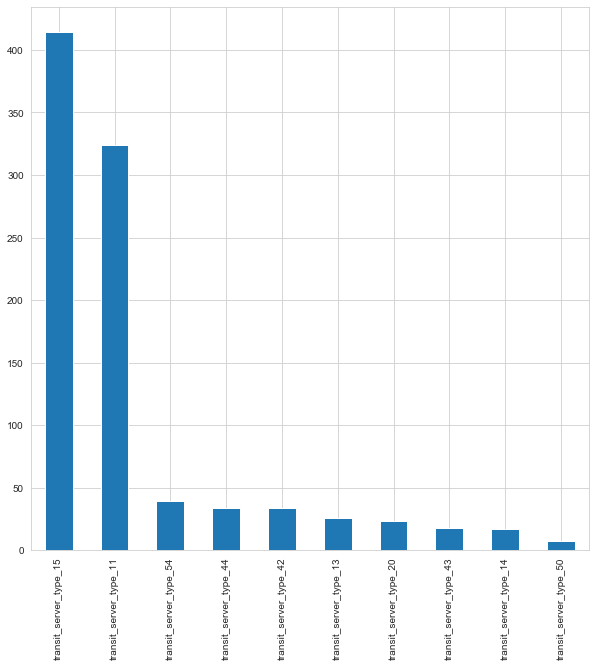

In [630]:
server_outage=long_outage_3_.transit_server_type.value_counts()
server_outage.head(10)
server_outage.head(10).plot(kind="bar",figsize=(10,10))